<center> <font size="+4">**ML - Classification Project**</font></center>

<center><font size="+2">Project: Mobile Price Range Prediction

      Contribution: Individual

** Name: Chayan Patra**</font></center>

<center><font size="+2"><u><B> Summary </B></u></font></center>

<B>Mobile Price Range Prediction: A Classification Analysis</B>


These days, mobile phones have become one of the most widely bought and sold devices. Each day sees the introduction of new mobiles featuring updated versions and enhanced capabilities. A multitude of mobile devices are bought and sold on a daily basis.

As a result, accurately estimating and predicting prices is a crucial aspect of consumer strategy. When introducing a new product, it is essential to set the right price to ensure that consumers perceive it as reasonable for purchase. Unfortunately, when buying mobile phones, individuals often struggle to make informed decisions due to a lack of accessible resources for price validation. To tackle this challenge, we have developed various classification models utilizing data pertaining to different features of mobile phones. The constructed model is then employed to forecast the price range for new mobile phones.

The primary goal of this study is to establish a correlation between the features of a mobile phone and its corresponding price range, categorizing it as either cheap (0), mid-range (1), expensive (2), or very expensive (3). Various classification models will be employed to ensure the precise classification of data into the appropriate price ranges.

# **Problem Statement**
**Overview:**

In the competitive mobile phone market companies want to understand sales data of mobile phones and factors which drive the prices. The objective is to find out some relation between features of a mobile phones (RAM, Internal Memory, etc) and its selling price in this problem, we do not have to predict the actual price but a price range indicating how high the price is ?

**AIM:**

In this Project, on the basis of the mobile specification like battery capacity, 3G or 4G, wifi, bluetooth, ram etc we are predicting Price range of a mobile.


# **GitHub Link:**

##**Exploratory Data Analysis(EDA):**

**Importing Required Libraries:**

In [ ]:
## required libraries
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import norm
from sklearn.preprocessing import StandardScaler
from scipy import stats

import warnings
warnings.filterwarnings('ignore')

**Dataset Loading and Importing Drive**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data = pd.read_csv('/content/drive/MyDrive/AlmaBetter Data Science/Classification Project/data_mobile_price_range.csv')

In [ ]:
data.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [ ]:
data.shape

(2000, 21)

In [ ]:
# overall data info
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [ ]:
# duplicated rows
data.duplicated().sum()

0

In [ ]:
# columns with null count
data.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

In [ ]:
data.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [ ]:
data.describe()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


In [ ]:
# number of unique values per feature
for i in data.columns.tolist():
  print(i+'=' ,data[i].nunique())

battery_power= 1094
blue= 2
clock_speed= 26
dual_sim= 2
fc= 20
four_g= 2
int_memory= 63
m_dep= 10
mobile_wt= 121
n_cores= 8
pc= 21
px_height= 1137
px_width= 1109
ram= 1562
sc_h= 15
sc_w= 19
talk_time= 19
three_g= 2
touch_screen= 2
wifi= 2
price_range= 4


In [ ]:
df = data.copy()

In [ ]:
df['price_range'].value_counts()

1    500
2    500
3    500
0    500
Name: price_range, dtype: int64

**Data Spread Across Key Features**

In [ ]:
# groupby and aggregating column
df.groupby('four_g')['price_range'].value_counts().unstack()

price_range,0,1,2,3
four_g,,,,
0,241,238,253,225
1,259,262,247,275


In [ ]:
df.groupby('three_g')['price_range'].value_counts().unstack()

price_range,0,1,2,3
three_g,,,,
0,127,122,113,115
1,373,378,387,385


In [ ]:
df.groupby('blue')['price_range'].value_counts().unstack()

price_range,0,1,2,3
blue,,,,
0,257,255,257,241
1,243,245,243,259


In [ ]:
df.groupby('dual_sim')['price_range'].value_counts().unstack()

price_range,0,1,2,3
dual_sim,,,,
0,250,245,251,235
1,250,255,249,265


In [ ]:
df.groupby('touch_screen')['price_range'].value_counts().unstack()

price_range,0,1,2,3
touch_screen,,,,
0,238,239,265,252
1,262,261,235,248


In [ ]:
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


## **What did you know about your dataset?**

1. The given dataset from competitive mobile market companies, and we do not have to predict the actual price but a price range indicating how high the price is.

2. Mobile phones come in all sorts of prices, features, specifications and all. Price estimation and prediction is an important part of consumer strategy. Deciding on the correct price of a product is very important for the market success of a product. A new product that has to be launched, must have the correct price so that consumers find it appropriate to buy the product.

3. The above dataset has 2000 rows and 20 columns. There are no mising values and duplicate values in the dataset.

##**Description of features:**

**Battery_power:** Total energy a battery can store in one time measured in mAh

**Blue :** Has bluetooth or not

**Clock_speed :** speed at which microprocessor executes instructions

**Dual_sim :** Has dual sim support or not

**Fc :** Front Camera mega pixels

**Four_g :** Has 4G or not

**Int_memory :** Internal Memory in Gigabytes

**M_dep :** Mobile Depth in cm

**Mobile_wt :** Weight of mobile phone

**N_cores :** Number of cores of processor

**Pc :** Primary Camera mega pixels

**Px_height :** Pixel Resolution Height

**Px_width :** Pixel Resolution Width

**Ram :** Random Access Memory in Mega

**Touch_screen :** Has touch screen or not

**Wifi :** Has wifi or not

**Sc_h :** Screen Height of mobile in cm

**Sc_w :** Screen Width of mobile in cm

**Talk_time :** longest time that a single battery charge will last when you are

**Three_g :** Has 3G or not

**Wifi :** Has wifi or not

**Price_range :** This is the target variable with value of 0(low cost), (medium cost),2(high cost) and 3(very high cost).

## **Chart- #01**

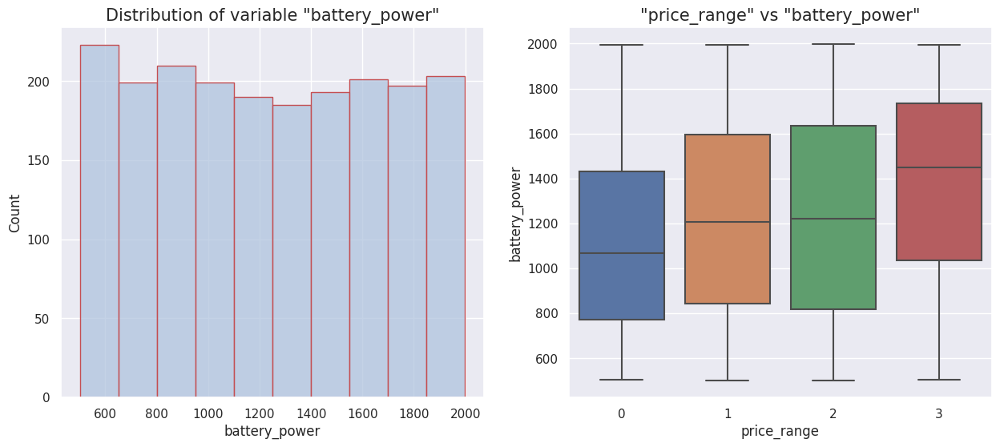

In [ ]:
## Battery_power : Total energy a battery can store in one time measured in mAh

fig, axs = plt.subplots(ncols=2,figsize = (15, 6))                                                  # creating firgure and axis system

sns.histplot(data['battery_power'], color='lightsteelblue',ax=axs[0], edgecolor='r', bins=10)       # histogram plot--- first column
axs[0].set_title('Distribution of variable "battery_power"',fontsize = 15)



sns.boxplot(x="price_range", y="battery_power", data=data, ax=axs[1])                               # box plot----- second column
axs[1].set_title('"price_range" vs "battery_power"',fontsize = 15)

plt.show()

##**Why did you pick the specific chart? What is/are the insight(s) found from the chart?**

Histograms are commonly used in exploratory data analysis to help understand the underlying structure of the data.A histogram is a type of chart that is often used to visualize the distribution of a dataset. By creating a histogram for each column in the data_num DataFrame, you can quickly see the distribution of the data in each column and identify any patterns or trends. This can be useful for understanding the data and identifying any potential issues or outliers.

The histogram plot shows that the variable 'battery_power' is somewhat uniformly distributed in the range of 500 to 2000. This Means that the mobile with lowest battery is given 500 mAh and highest one is having around 2000 mAh battery power.

Along with that we can observe a upward trend of 'battery_power' and 'price_range'. This shows that as the price of the mobile go higher the mAh battery is will go up alongside.

## **Chart- #02**





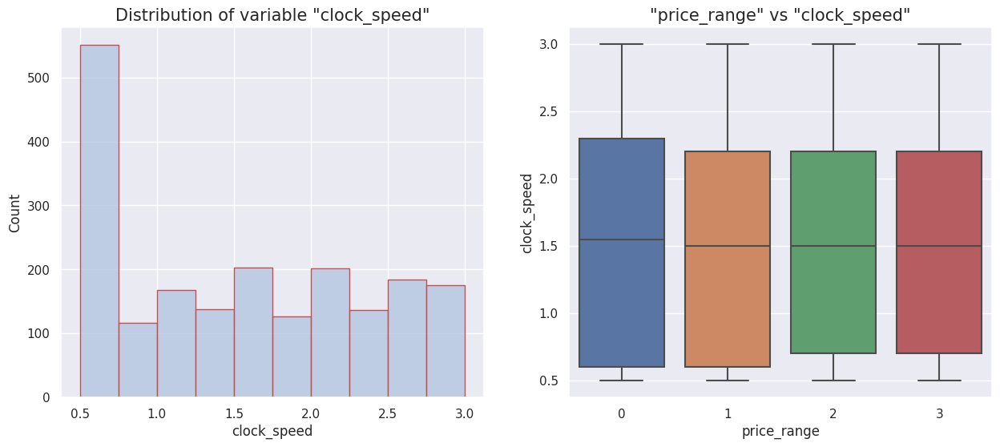

In [ ]:
## Clock_speed : speed at which microprocessor executes instructions
# creating firgure and axis system
fig, axs = plt.subplots(ncols=2,figsize = (15, 6))

# histogram plot--- first column
sns.histplot(data['clock_speed'], color='lightsteelblue',ax=axs[0], edgecolor='r', bins=10)
axs[0].set_title('Distribution of variable "clock_speed"',fontsize = 15)


# box plot----- second column
sns.boxplot(x="price_range", y="clock_speed", data=data, ax=axs[1])
axs[1].set_title('"price_range" vs "clock_speed"',fontsize = 15)

plt.show()

##**Why did you pick the specific chart? What is/are the insight(s) found from the chart?**

Histograms are commonly used in exploratory data analysis to help understand the underlying structure of the data.A histogram is a type of chart that is often used to visualize the distribution of a dataset.

Clock speed is the number of times a second that a circuit operates and is most associated with the central processing unit (CPU). It is measured in hertz, or cycles per second. The higher the clock speed, the more processing power.

For our dataset, most of the mobiles have lesser clock_speed and less number of mobiles are having higher clock speed. So, the data is not equally distributed.

The varible does have a weak correlation with the target variable 'price_range'.

## **Chart- #03**

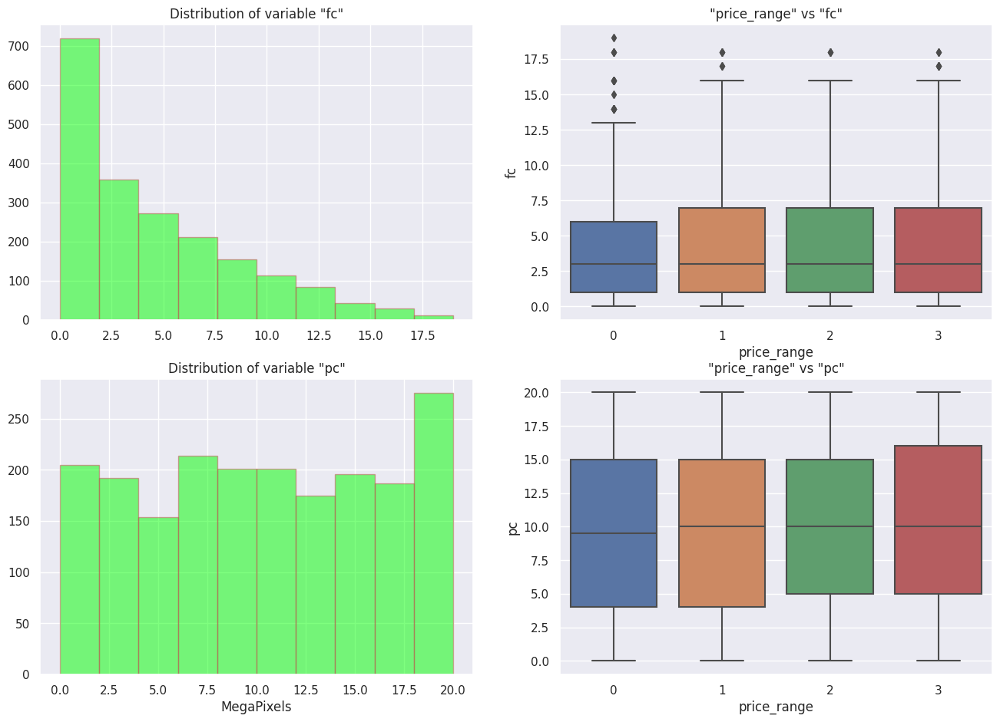

In [ ]:
## fc : Front Camera mega pixels
## pc : Primary Camera mega pixels

fig, (ax1, ax2) = plt.subplots(nrows= 2,ncols=2, figsize = (16, 11))  # create 2 rows and 2 columns, assign 1st row to ax1 and 2nd row to ax2



ax1[0].hist(data['fc'], alpha=0.5,color='lime', edgecolor='r')        # ax1[0] has histogram plotted
ax1[0].set_title('Distribution of variable "fc"')

sns.boxplot(x="price_range", y="fc", data=data, ax=ax1[1])            # ax1[1] has boxplot plotted
ax1[1].set_title('"price_range" vs "fc"')


ax2[0].hist(data['pc'], alpha=0.5,color='lime', edgecolor='r')        # ax2[0] has histogram plotted
ax2[0].set_title('Distribution of variable "pc"')
ax2[0].set_xlabel('MegaPixels')

sns.boxplot(x="price_range", y="pc", data=data, ax=ax2[1])            # ax2[1] has boxplot plotted
ax2[1].set_title('"price_range" vs "pc"')



plt.show()

##**Why did you pick the specific chart? What is/are the insight(s) found from the chart?**

We are exloring two of the features here in this chart named 'fc' and 'pc' abbreviated for Front Camera mega pixels and Primary Camera mega pixels respectively. The variable 'fc' is skewly distributed which means majority of the mobiles have less mega pixel of front camera in our dataset. Whereas, the 'pc' variable is somewhat uniformly distributed over the range.

Both of the variables are influencing the target variable 'price_range' in positive manner.

## **Chart- #04**

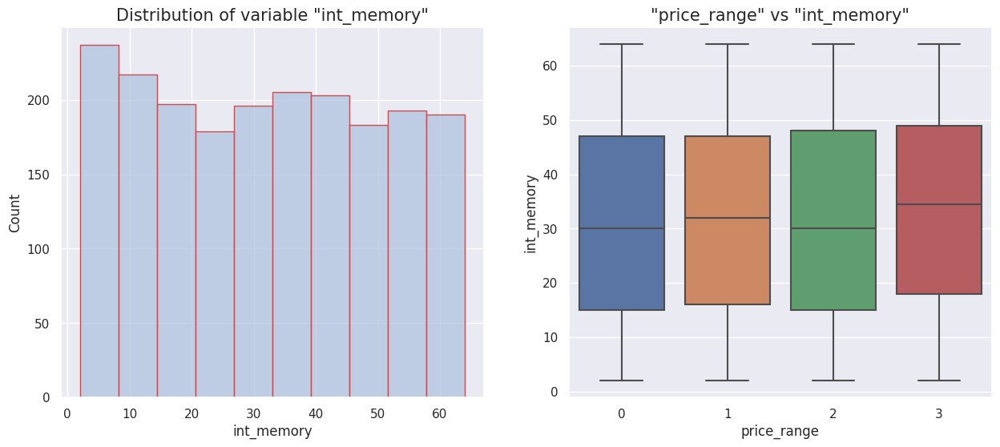

In [ ]:
##  Int_memory : Internal Memory in Gigabytes

fig, axs = plt.subplots(ncols=2,figsize = (15, 6))

sns.histplot(data['int_memory'], color='lightsteelblue',ax=axs[0], edgecolor='r', bins=10)
axs[0].set_title('Distribution of variable "int_memory"',fontsize = 15)



sns.boxplot(x="price_range", y="int_memory", data=data, ax=axs[1])
axs[1].set_title('"price_range" vs "int_memory"',fontsize = 15)

plt.show()

##**Why did you pick the specific chart? What is/are the insight(s) found from the chart?**

Internal Memory is also having somewhat uniform distribution of data in the given dataset, having a positive but weak kind of correlation with the target 'price_range'.

## **Chart- #05**

In [ ]:
data['ram'].describe()

count    2000.000000
mean     2124.213000
std      1084.732044
min       256.000000
25%      1207.500000
50%      2146.500000
75%      3064.500000
max      3998.000000
Name: ram, dtype: float64

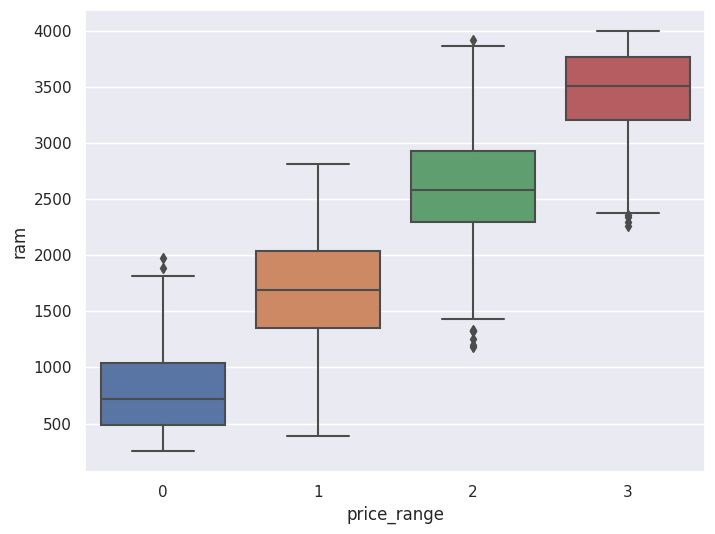

In [ ]:
## ram : Random Access Memory in Mega
plt.figure(figsize = (8, 6))
sns.boxplot(x="price_range", y="ram", data=data)
plt.show()

##**Why did you pick the specific chart? What is/are the insight(s) found from the chart?**

ram of a mobile is given by Mega Bytes. This is also uniformly distributed over the range. It has a very strong correlation with 'price_range'.

As the ram size go bigger, the more costly will the mobile become. This variable greatly influences the behaviour of the target 'price_range'.

## **Chart- #06**

In [ ]:
## Px_height : Pixel Resolution Height
## Px_width : Pixel Resolution Width
# feature engineering
df['px_count'] = df['px_width']*df['px_height']

In [ ]:
df_1 = df.sort_values(['px_count'])[['px_count','price_range']]
df_1

,px_count,price_range
1481,0,3
1933,0,1
801,926,0
1536,1320,1
1963,1887,1
...,...,...
894,3711360,2
1397,3720318,0
1017,3744520,3
1771,3847480,2


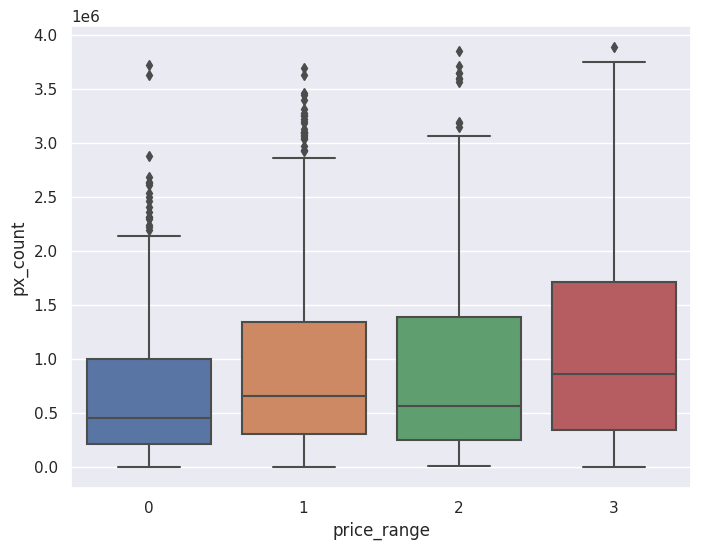

In [ ]:
plt.figure(figsize = (8, 6))
sns.boxplot(x="price_range", y="px_count", data=df_1)
plt.show()


##**Why did you pick the specific chart? What is/are the insight(s) found from the chart?**

A new variable named 'px_count' is created multiplying two existing variables 'px_width' and 'px_height' which denotes number of pixels widthwise and heightwise respectively. 'px_count' would give us total number of pixels that a particular mobile is having.

By analysing the box plot, we see somewhat weak upward trend in pricing when number of pixels are increasing. We could say this variable has some influence deciding our target variable 'price_range'.

## **Chart- #07**

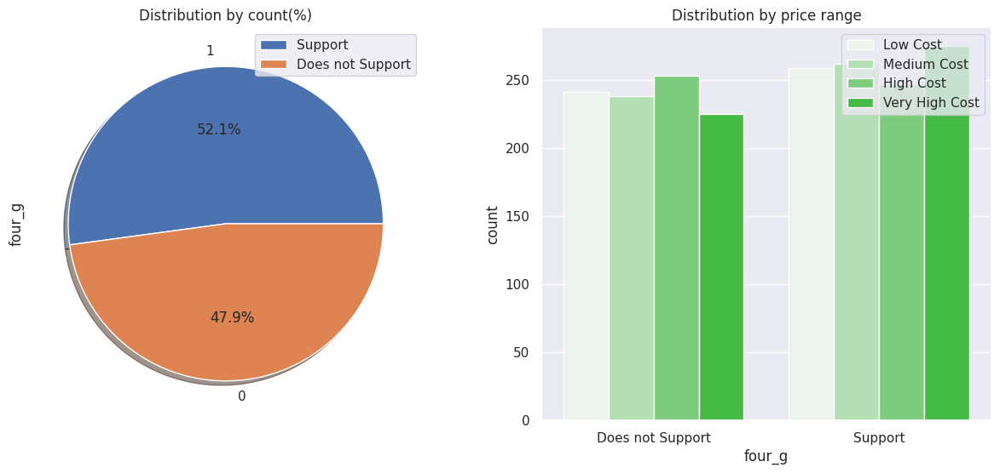

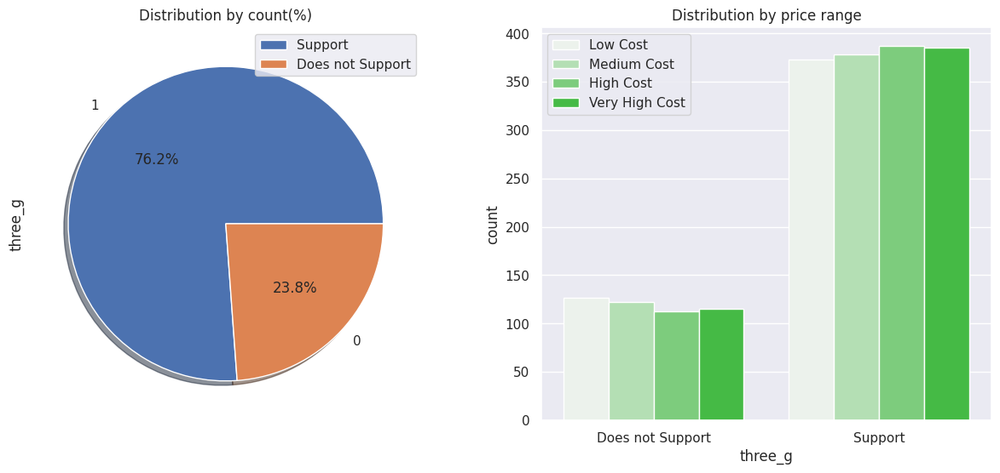

In [ ]:
##  four_g : Has 4G or not
##  three_g : Has 3G or not

for col in [ 'four_g', 'three_g']: #looping through axis system
  fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (15, 6))

  data[col].value_counts().plot.pie (autopct='%1.1f%%', ax = ax1, shadow=True)
  ax1.set_title('Distribution by count(%)')
  ax1.legend(['Support', 'Does not Support'])

  sns.countplot(x = col, hue = 'price_range', data = data, ax = ax2, color = "limegreen")
  ax2.set_title('Distribution by price range')
  ax2.set_xlabel(col)
  ax2.legend(['Low Cost', 'Medium Cost', 'High Cost', 'Very High Cost'])
  ax2.set_xticklabels(['Does not Support', 'Support'])

plt.show()

##**Why did you pick the specific chart? What is/are the insight(s) found from the chart?**

Pie chart is a type of graph in which a circle is divided into sectors that each represents a proportion of the whole. Pie charts are a useful way to organize data in order to see the size of components relative to four_g and three_g variable.

The bar graph is used to compare the items between different groups of price range. Bar graphs are used to measure the 4 variable counting the which mobile support and which mobile are not support.

**three_g**

1.support=76.2%

2.dosenot support=23.8%

**four_g**

1.support=52.1%

2.doesnot support=47.9%

also we've shown that very high budget mobiles comes with 4G.

## **Chart- #08**

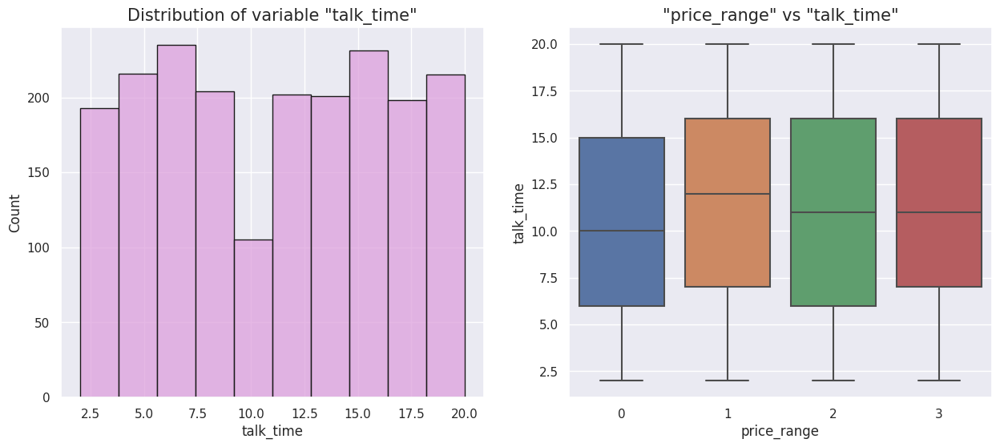

In [ ]:
##  Talk_time : longest time that a single battery charge will last when you are
fig, axs = plt.subplots(ncols=2,figsize = (15, 6))

sns.histplot(data['talk_time'], color='plum',ax=axs[0], edgecolor='k', bins=10)
axs[0].set_title('Distribution of variable "talk_time"',fontsize = 15)



sns.boxplot(x="price_range", y="talk_time", data=data, ax=axs[1])
axs[1].set_title('"price_range" vs "talk_time"',fontsize = 15)

plt.show()

##**Why did you pick the specific chart? What is/are the insight(s) found from the chart?**

To figure out if there is any relationship that exist in between 'talk_time' and target variable 'price_range'. We can visually see that the variable 'talk_time' is more or less uniformly distributed. It's not really affecting the target 'price_range' in some specific way.

## **Chart- #09**

In [ ]:
# replace 0 with median
data['sc_w']= data['sc_w'].replace(0, np.median(data['sc_w']))

In [ ]:
## Sc_h : Screen Height of mobile in cm
## Sc_w : Screen Width of mobile in cm

data[['sc_h','sc_w']].describe()

,sc_h,sc_w
count,2000.000000,2000.000000
mean,12.306500,6.217000
std,4.213245,3.979174
min,5.000000,1.000000
25%,9.000000,3.000000
50%,12.000000,5.000000
75%,16.000000,9.000000
max,19.000000,18.000000


In [ ]:
# feature engineering
data['sc_area'] = data['sc_h']*data['sc_w']

In [ ]:
data['sc_area'].describe()

count    2000.000000
mean       84.979500
std        73.551601
min         5.000000
25%        30.000000
50%        60.000000
75%       121.500000
max       342.000000
Name: sc_area, dtype: float64

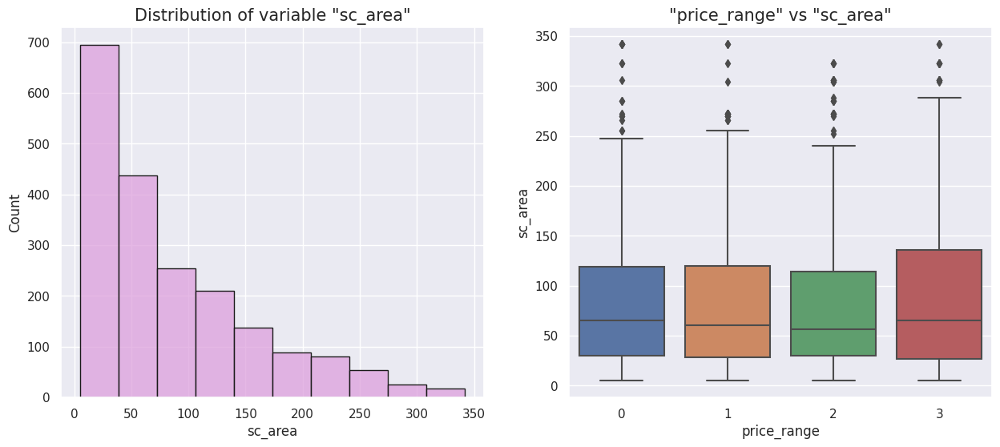

In [ ]:
fig, axs = plt.subplots(ncols=2,figsize = (15, 6))

sns.histplot(data['sc_area'], color='plum',ax=axs[0], edgecolor='k', bins=10)
axs[0].set_title('Distribution of variable "sc_area"',fontsize = 15)



sns.boxplot(x="price_range", y="sc_area", data=data, ax=axs[1])
axs[1].set_title('"price_range" vs "sc_area"',fontsize = 15)

plt.show()

##**Why did you pick the specific chart? What is/are the insight(s) found from the chart?**

To figure out if there is any relationship that exist in between 'sc_area' and target variable 'price_range'. We can visually see that the variable 'sc_area' is highly skewed. It's not really affecting the target 'price_range' in some specific way.

For most of the mobiles we have in our dataset, the sc_area or screen area is on the lower side.

## **Chart- #10**

In [ ]:
## Categorical features
data_cat = data[['blue','dual_sim', 'four_g','three_g','touch_screen', 'wifi']]

In [ ]:
data_cat

,blue,dual_sim,four_g,three_g,touch_screen,wifi
0,0,0,0,0,0,1
1,1,1,1,1,1,0
2,1,1,1,1,1,0
3,1,0,0,1,0,0
4,1,0,1,1,1,0
...,...,...,...,...,...,...
1995,1,1,1,1,1,0
1996,1,1,0,1,1,1
1997,0,1,1,1,1,0
1998,0,0,1,1,1,1


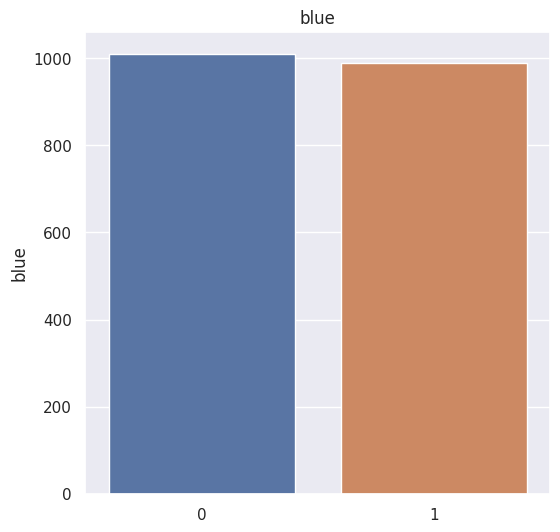

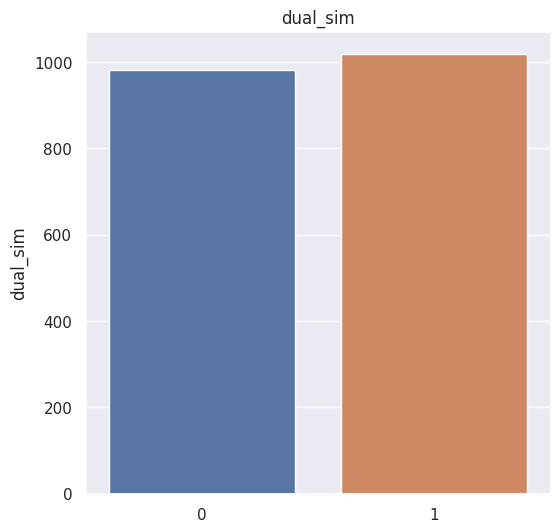

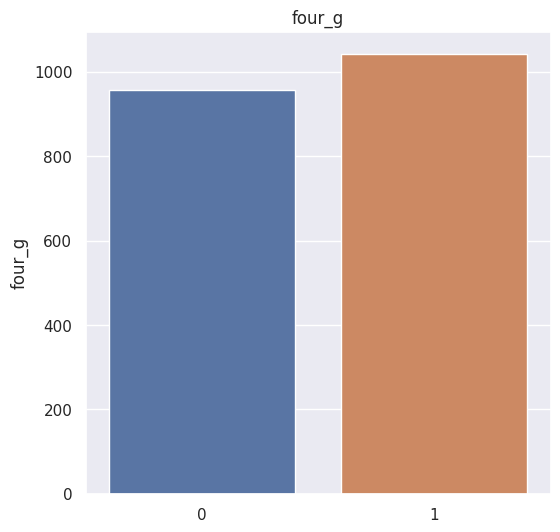

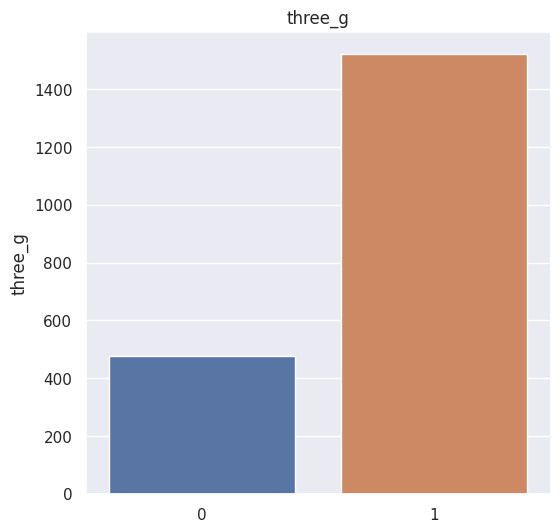

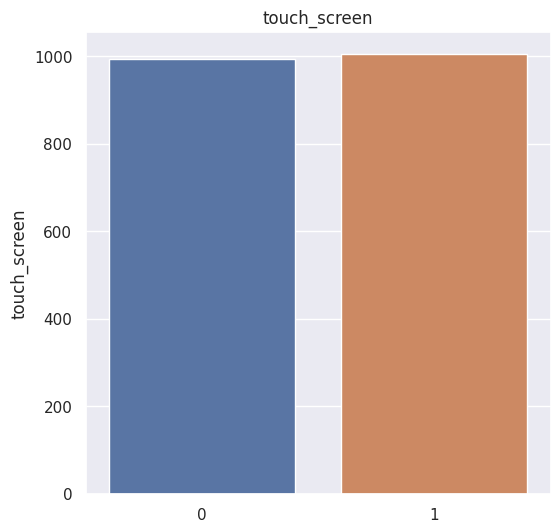

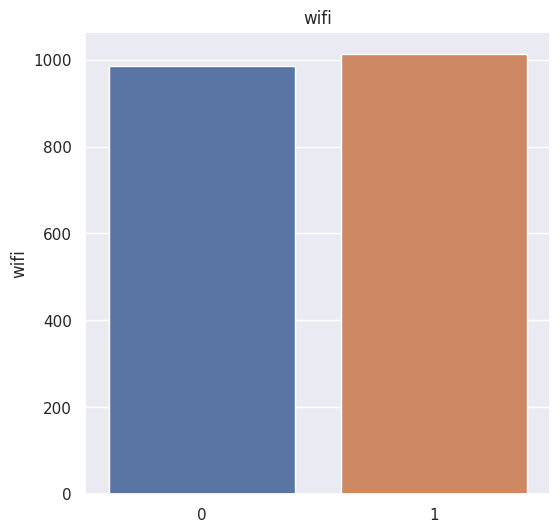

In [ ]:
# plotting categorical features and their count
for i in data_cat.columns:
    sns.barplot(x=data_cat[i].value_counts().index, y=data_cat[i].value_counts()).set_title(i)
    plt.show()


##**Why did you pick the specific chart? What is/are the insight(s) found from the chart?**

In this bar plot graph we check all catagorical column along with the frequency. We simply check for either yes or a no for each columns where 1 represents yes and no represented by 0. In this graph we saw that nearly 50% mobile have touch screen, bluetooth, wifi, four_g and dual sim features.

## **Chart- #11**

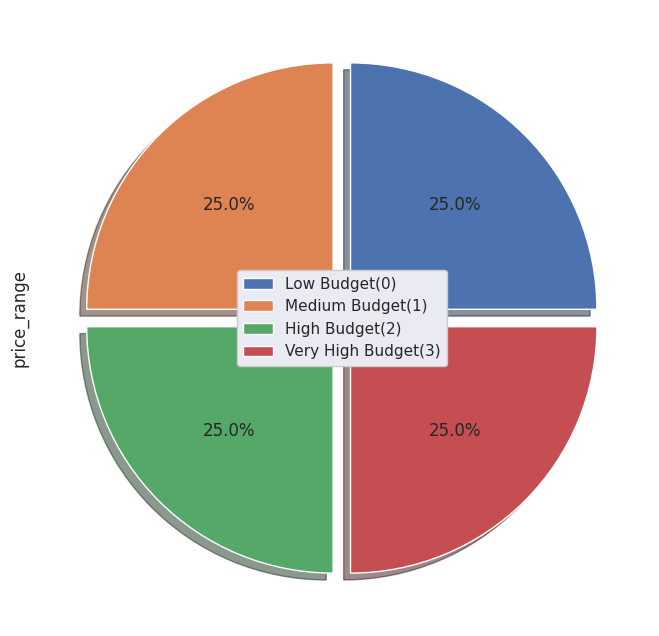

In [ ]:
data['price_range'].value_counts().plot(kind='pie', autopct="%1.1f%%", shadow=True,
                                        explode=[0.05,0.05,0.05,0.05],
                                        figsize=(12,8), labels=None
                                        )
plt.legend(labels=["Low Budget(0)", "Medium Budget(1)", "High Budget(2)", "Very High Budget(3)"], loc= 'center',framealpha=1)
plt.show()

##**Why did you pick the specific chart? What is/are the insight(s) found from the chart?**

Finally, our target variable named as 'price_range' that is having four different sections represented by 0, 1, 2 and 3 for varying prices where 0 represents mobiles with lowest possible price and 3 representing the highest ones.

By plotting the count of the price classes we observed that we have equal number of mobile phones for each segment in our dataset.

This implies that all classes are eually important in our analysis and a through inspection could give us some insight eventually leading to maximizes our sell and gain more profit.

## **Chart- #12**

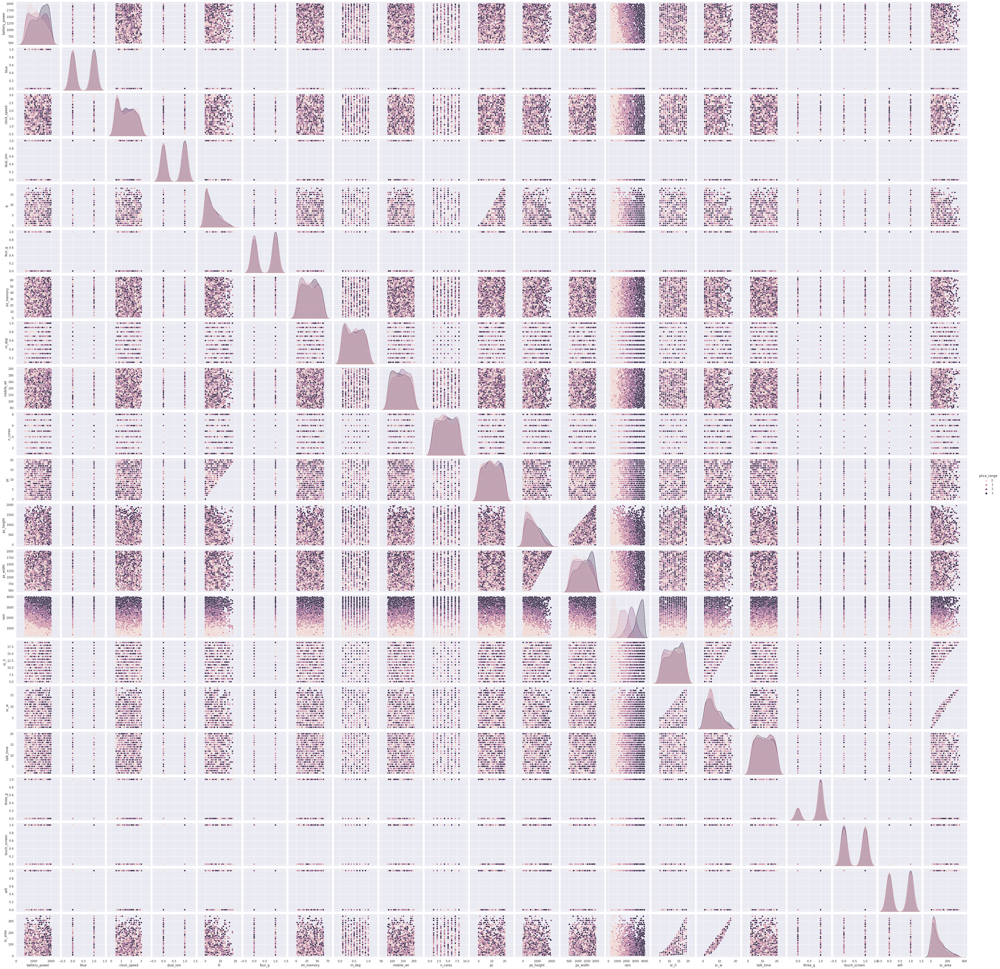

In [ ]:
## generating pairplot
sns.pairplot(data, hue= 'price_range')
plt.show()

##**Why did you pick the specific chart? What is/are the insight(s) found from the chart?**

The Seaborn Pairplot allows us to plot pairwise relationships between variables within a dataset. This creates a nice visualisation and helps us understand the data by summarising a large amount of data in a single figure. This is essential when we are exploring our dataset and trying to become familiar with it.

From the above chart I got to know, there are less linear relationship between variables and data points aren't linearly separable.Mobile price range is clusetered. Some of the above features are linearly dependent on price range like ram, internal memory, processors and so on.

## **Chart- #13**

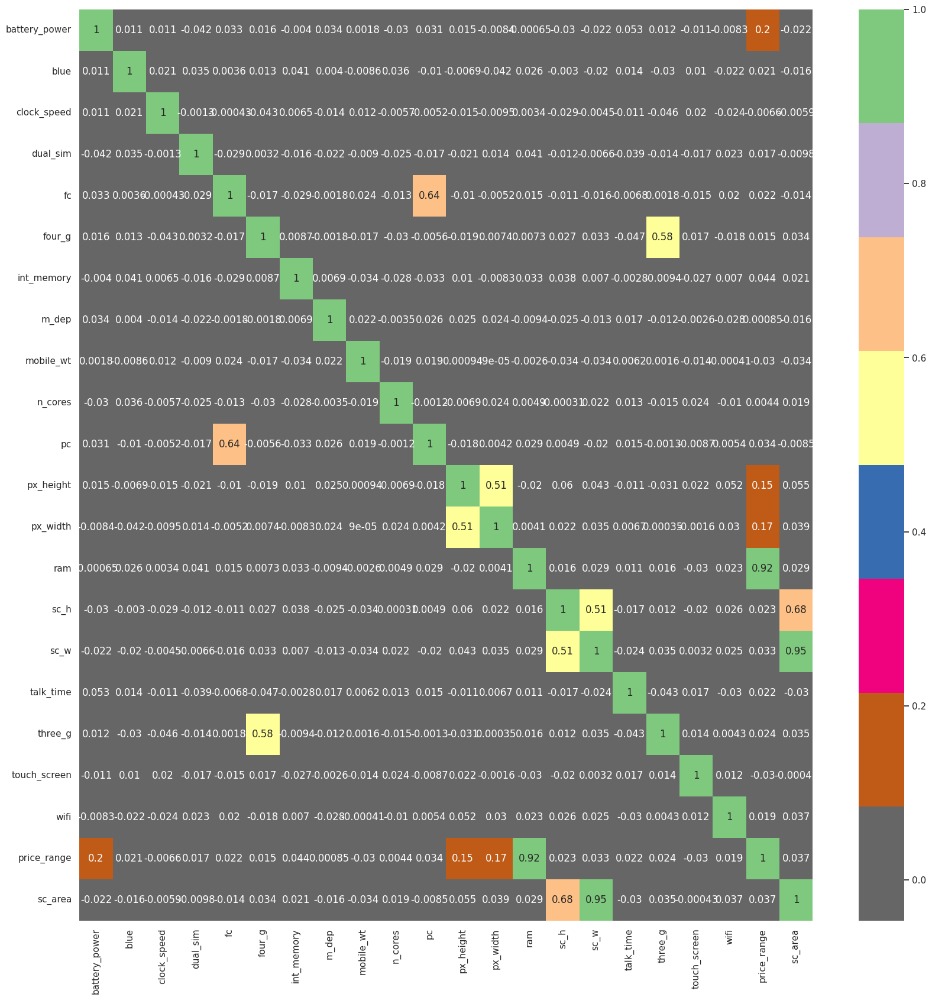

In [ ]:
# Correlation Heatmap visualization code

plt.figure(figsize=(20,20))
sns.heatmap(data.corr(),annot=True,cmap=plt.cm.Accent_r)
plt.show()

##**Why did you pick the specific chart? What is/are the insight(s) found from the chart?**

A correlation matrix is a table showing correlation coefficients between variables. Each cell in the table shows the correlation between two variables. A correlation matrix is used to summarize data, as an input into a more advanced analysis, and as a diagnostic for advanced analyses. The range of correlation is (-1,1).

Thus to know the correlation between all the variables along with the correlation coefficients, here we've used this one.

From the above correlation heatmap,

1. we can see total price range are positiveliy highly correlated with a value of 1.

2. we can see total ram are correlated with a value of 92%.

3. we can see total pc and fc are correlated with a value of 65%.

price range is positively correlated only with all features and negative correlated with rest variables.

Rest all correlation can be depicted from the above chart.

## **Chart- #14**

###**Outlier Treatment:**

In [ ]:
#creating a new instance of dataset
new_df = pd.read_csv('/content/drive/MyDrive/AlmaBetter Data Science/Classification Project/data_mobile_price_range.csv')

In [ ]:
def outlierfreecolumn(col):                                               ## define a function for capping outliers

  percentile25 = new_df[col].quantile(0.25)
  percentile75 = new_df[col].quantile(0.75)

  iqr = percentile75 - percentile25                                       ## getting IQR

  upper_limit = percentile75 + 1.5 * iqr                                  ## 75%-ile + (1.5*IQR) = Upper Limit
  lower_limit = percentile25 - 1.5 * iqr                                  ## 25%-ile - (1.5*IQR) = Lower Limit

  new_col= []
  ##capping values beyond upper & lower limit

  new_col = np.where(new_df[col]>upper_limit, upper_limit, new_df[col] )  ## np.where(condition, if True, if False)

  new_col = np.where(new_col<lower_limit, lower_limit, new_col )          ## np.where(condition, if True, if False)


  return new_col




In [ ]:
new_df.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

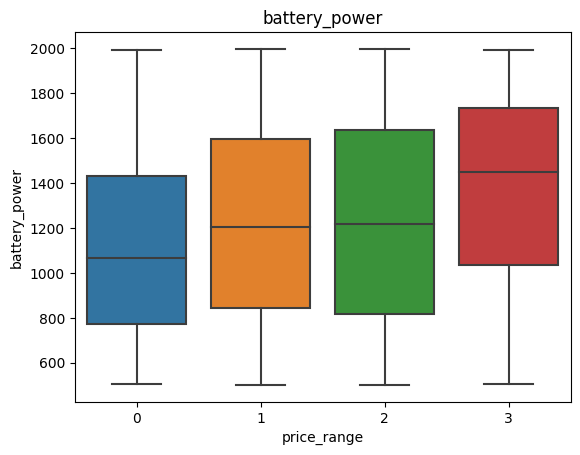

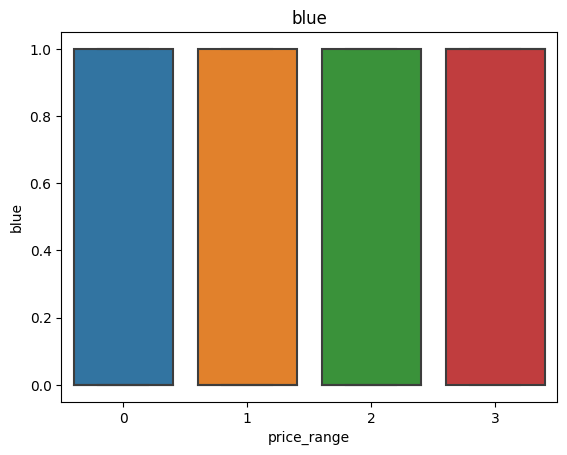

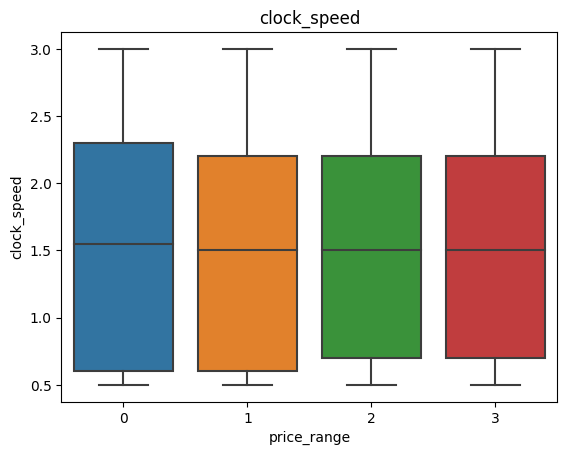

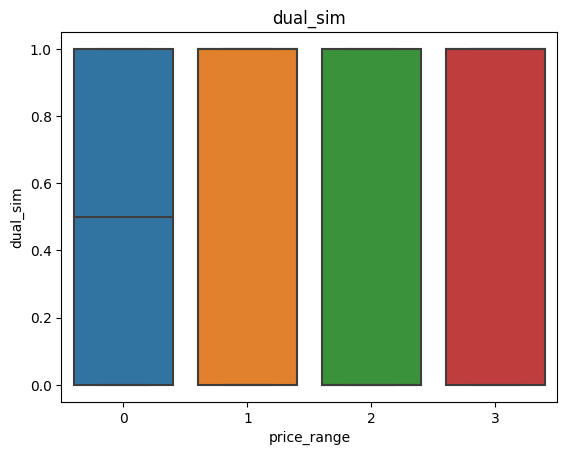

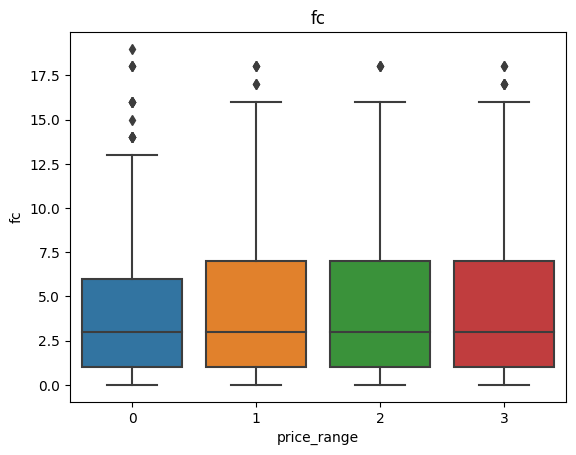

...

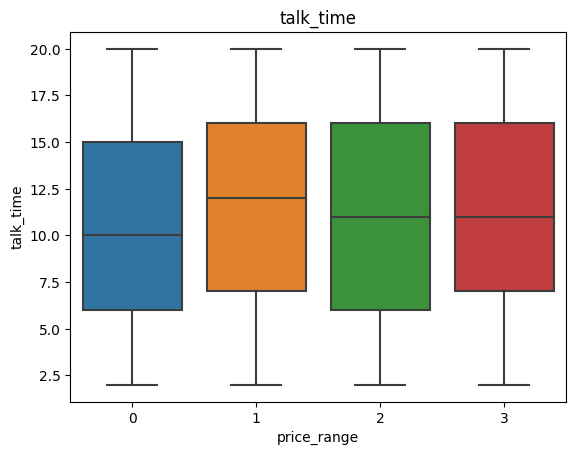

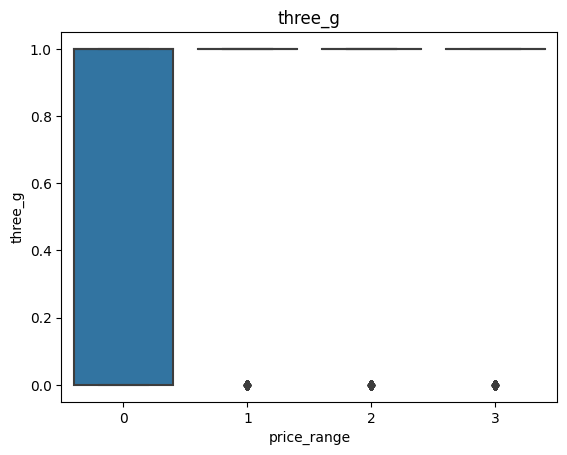

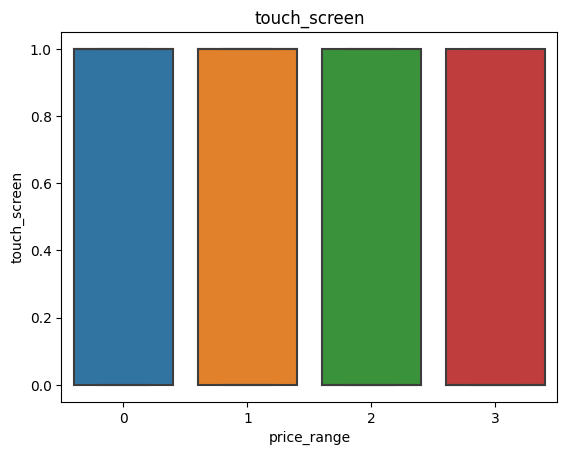

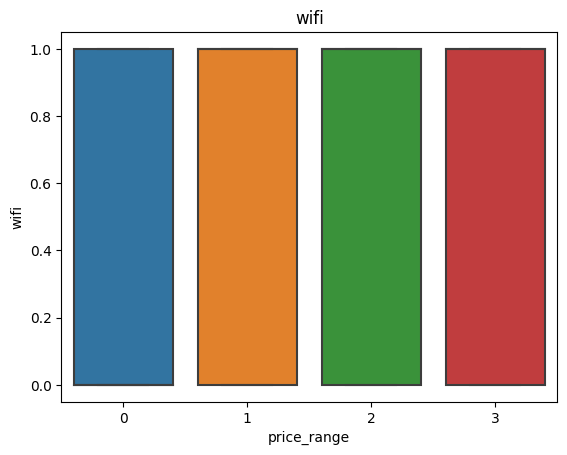

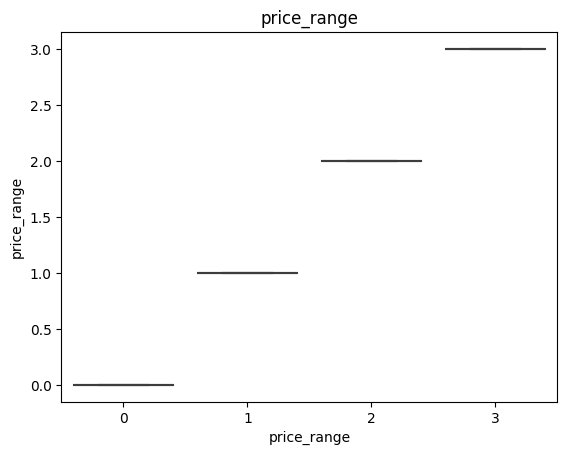

In [ ]:
#check for outliers
for i in new_df.columns:
  sns.boxplot(x=new_df['price_range'], y=new_df[i])
  plt.title(i)
  plt.show()

##**Why did you pick the specific chart? What is/are the insight(s) found from the chart?**
**Columns having outliers:**

**['fc', 'px_height', 'ram', 'sc_w']**

Will loop through those above mentioned columns using the function we have created earlier to cap the outliers present in these columns.

This chart here helps to visualize the outliers present.

In [ ]:
## capping outliers
for i in ['fc', 'px_height', 'ram', 'sc_w']:
  new_col= outlierfreecolumn(i)    # assign returnd column to new_col
  new_df[i]= new_col               # replace new_col to new_df

In [ ]:
new_df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1.0,0,7,0.6,188,2,...,20.0,756,2549.0,9,7.0,19,0,0,1,1
1,1021,1,0.5,1,0.0,1,53,0.7,136,3,...,905.0,1988,2631.0,17,3.0,7,1,1,0,2
2,563,1,0.5,1,2.0,1,41,0.9,145,5,...,1263.0,1716,2603.0,11,2.0,9,1,1,0,2
3,615,1,2.5,0,0.0,0,10,0.8,131,6,...,1216.0,1786,2769.0,16,8.0,11,1,0,0,2
4,1821,1,1.2,0,13.0,1,44,0.6,141,2,...,1208.0,1212,1411.0,8,2.0,15,1,1,0,1


###**Feature Engineering:**

In [ ]:
#  defining new variable for pixels

new_df['pixels'] = new_df['px_height']*new_df['px_width']
# Dropping px_height and px_width

new_df.drop(['px_height', 'px_width'],axis=1,inplace=True)

In [ ]:
# Defining X and y
x = new_df.drop(['price_range'], axis = 1).values
y = new_df['price_range'].values

In [ ]:
print(x.shape)
print(y.shape)

(2000, 19)
(2000,)


###**Train-Test-Splitting of Dataset:**

In [ ]:
#separate the dataset in two type one trainingis 75% of data and other testing is 25% of data
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test= train_test_split(x,y, test_size= 0.25, random_state=167)
print(x_train.shape)
print(x_test.shape)

(1500, 19)
(500, 19)


In [ ]:
x_train

array([[1.469000e+03, 0.000000e+00, 2.100000e+00, ..., 1.000000e+00,
        0.000000e+00, 4.509340e+05],
       [1.617000e+03, 1.000000e+00, 2.400000e+00, ..., 0.000000e+00,
        0.000000e+00, 1.059518e+06],
       [1.349000e+03, 0.000000e+00, 2.000000e+00, ..., 0.000000e+00,
        0.000000e+00, 4.570240e+05],
       ...,
       [1.914000e+03, 0.000000e+00, 7.000000e-01, ..., 0.000000e+00,
        1.000000e+00, 1.602342e+06],
       [1.289000e+03, 0.000000e+00, 8.000000e-01, ..., 1.000000e+00,
        0.000000e+00, 1.321902e+06],
       [1.368000e+03, 1.000000e+00, 1.600000e+00, ..., 1.000000e+00,
        0.000000e+00, 9.652350e+05]])

###**Scaling Values of Data:**

In [ ]:
# Scaling of column values
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [ ]:
x_train

array([[0.64639037, 0.        , 0.64      , ..., 1.        , 0.        ,
        0.12120846],
       [0.74532086, 1.        , 0.76      , ..., 0.        , 0.        ,
        0.28479232],
       [0.56617647, 0.        , 0.6       , ..., 0.        , 0.        ,
        0.12284541],
       ...,
       [0.94385027, 0.        , 0.08      , ..., 0.        , 1.        ,
        0.43070028],
       [0.52606952, 0.        , 0.12      , ..., 1.        , 0.        ,
        0.35531963],
       [0.57887701, 1.        , 0.44      , ..., 1.        , 0.        ,
        0.2594496 ]])

#**Machine Learning(ML) Implementation:**

### In this section we will be using various classification algorithms and compare results from them to figure out the best classifier for our dataset. The following algorithms are below.

1. K Nearest Neighbours(KNN)

2. Naive Bayes Theorm

3. Support Vector Machine Classifier(SVM)

4. DecisionTree Classifier

5. RandomForestClassifier

6. XGBoost Classifier

In [ ]:
#importing all libraries
from sklearn.metrics import confusion_matrix ,classification_report,precision_score, recall_score ,f1_score, roc_auc_score,accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

## **Model- #01 : K Nearest Neighbours(KNN)**

In [ ]:
# Import KNeighborsClassifier
from sklearn.neighbors import KNeighborsClassifier

#Setup arrays to store training and test accuracies
neighbors = np.arange(1,100)
train_accuracy =np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

for i,k in enumerate(neighbors):
    # Setup a knn classifier with k neighbors
    knn = KNeighborsClassifier(n_neighbors=k)

    # Fit the model
    knn.fit(x_train, y_train)

    # Compute accuracy on the training set
    train_accuracy[i] = knn.score(x_train, y_train)

    # Compute accuracy on the test set
    test_accuracy[i] = knn.score(x_test, y_test)

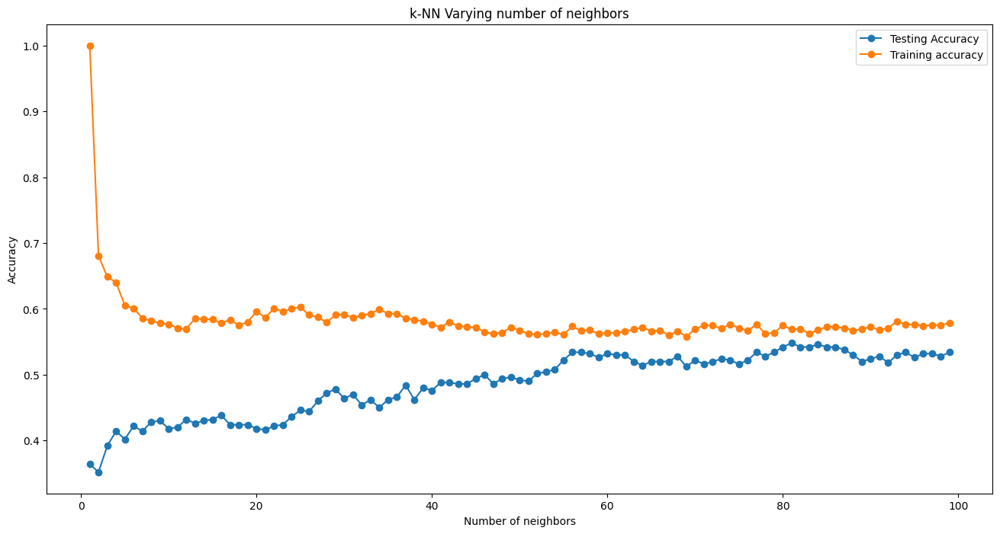

In [ ]:
# Generate plot
plt.figure(figsize=(16,8))
plt.title('k-NN Varying number of neighbors')
plt.plot(neighbors, test_accuracy, label='Testing Accuracy',marker='o')
plt.plot(neighbors, train_accuracy, label='Training accuracy',marker='o')
plt.legend()
plt.xlabel('Number of neighbors')
plt.ylabel('Accuracy')
plt.show()

In [ ]:
# for with k the difference is lowest
diff_df = pd.DataFrame(train_accuracy, test_accuracy)
diff_df.reset_index(inplace=True)
diff_df.rename(columns={'index':'test_accuracy', 0: 'train_accuracy'}, inplace=True)
diff_df['difference']= train_accuracy- test_accuracy
diff_df[diff_df.difference ==diff_df.difference.min()]

,test_accuracy,train_accuracy,difference
80,0.548,0.568667,0.020667
82,0.542,0.562667,0.020667


In [ ]:
# Setup a knn classifier with k neighbors
knn = KNeighborsClassifier(n_neighbors=83)
# Fit the model
knn.fit(x_train,y_train)

KNeighborsClassifier(n_neighbors=83)

In [ ]:
# Predict on the model
# Get the predicted classes
trainscore =  knn.score(x_train,y_train)
testscore =  knn.score(x_test,y_test) ##Accuracy score of testing data

print("train score: {}".format(trainscore),'\n')
print("test score: {}".format(testscore),'\n')
y_predlogi =  knn.predict(x_test)
print(' f1 score: ',f1_score(y_test, y_predlogi,average='micro'),'\n')
print(confusion_matrix(y_test, y_predlogi))

train score: 0.5626666666666666 

test score: 0.542 

 f1 score:  0.542 

[[90 39  3  0]
 [30 50 26  3]
 [ 6 36 65 12]
 [ 1  7 66 66]]


In [ ]:
print(' precision score: ',precision_score(y_test, y_predlogi,average='micro'),'\n')
print(' recall score: ',recall_score(y_test, y_predlogi,average='micro'),'\n')
print(classification_report(y_test, y_predlogi))

 precision score:  0.542 

 recall score:  0.542 

              precision    recall  f1-score   support

           0       0.71      0.68      0.69       132
           1       0.38      0.46      0.41       109
           2       0.41      0.55      0.47       119
           3       0.81      0.47      0.60       140

    accuracy                           0.54       500
   macro avg       0.58      0.54      0.54       500
weighted avg       0.59      0.54      0.55       500



In [ ]:
#keeping track of the accuracy score for comparison
accuracy_df = pd.DataFrame(columns= ['classifier', 'accuracy score'])
accuracy_df.loc[len(accuracy_df.index)] = ['KNN', testscore]
accuracy_df

,classifier,accuracy score
0,KNN,0.542


**Here we've implemented KNN classifier. For training and testing we have got 56.26% and 54.2% accuracy respectively.**

## **Model- #02 : Naive Bayes Theorm**

In [ ]:
#applying naive_bayes_classifier
NBmodel = GaussianNB()
NBmodel.fit(x_train, y_train)

GaussianNB()

In [ ]:
trainscore =  NBmodel.score(x_train,y_train)
testscore =  NBmodel.score(x_test,y_test)

print("train score: {}".format(trainscore),'\n')
print("test score: {}".format(testscore),'\n')
y_predNB =  NBmodel.predict(x_test)
print(' f1 score: ',f1_score(y_test, y_predNB,average='micro'),'\n')
print(confusion_matrix(y_test, y_predNB))

train score: 0.814 

test score: 0.802 

 f1 score:  0.802 

[[116  16   0   0]
 [  6  79  24   0]
 [  0  20  80  19]
 [  0   0  14 126]]


In [ ]:
print(' precision score: ',precision_score(y_test, y_predNB,average='micro'),'\n')
print(' recall score: ',recall_score(y_test, y_predNB,average='micro'),'\n')
print(classification_report(y_test, y_predNB))

 precision score:  0.802 

 recall score:  0.802 

              precision    recall  f1-score   support

           0       0.95      0.88      0.91       132
           1       0.69      0.72      0.71       109
           2       0.68      0.67      0.68       119
           3       0.87      0.90      0.88       140

    accuracy                           0.80       500
   macro avg       0.80      0.79      0.79       500
weighted avg       0.81      0.80      0.80       500



In [ ]:
#keeping track of the accuracy score for comparison
accuracy_df.loc[len(accuracy_df.index)] = ['Naive Bayes', testscore]
accuracy_df

,classifier,accuracy score
0,KNN,0.542
1,Naive Bayes,0.802


**Here we've implemented Naive Bayes Theorm classifier. For training and testing we have got 81.4% and 80.2% accuracy respectively.**

## **Model- #03 : Support Vector Machine Classifier(SVM)**


In [ ]:
#applying support vector machine classifier
svcmodel = SVC(probability=True)
svcmodel.fit(x_train, y_train)

SVC(probability=True)

In [ ]:
trainscore =  svcmodel.score(x_train,y_train)
testscore =  svcmodel.score(x_test,y_test)

print("train score: {}".format(trainscore),'\n')
print("test score: {} ".format(testscore),'\n')
y_predsvc =  svcmodel.predict(x_test)
print(' f1 score: ',f1_score(y_test, y_predsvc,average='micro'),'\n')
print(confusion_matrix(y_test, y_predsvc))

train score: 0.9573333333333334 

test score: 0.832  

 f1 score:  0.832 

[[113  19   0   0]
 [  8  88  13   0]
 [  0  13  96  10]
 [  0   0  21 119]]


In [ ]:
print(' precision score: ',precision_score(y_test, y_predsvc,average='micro'),'\n')
print(' recall score: ',recall_score(y_test, y_predsvc,average='micro'),'\n')
print(classification_report(y_test, y_predsvc))

 precision score:  0.832 

 recall score:  0.832 

              precision    recall  f1-score   support

           0       0.93      0.86      0.89       132
           1       0.73      0.81      0.77       109
           2       0.74      0.81      0.77       119
           3       0.92      0.85      0.88       140

    accuracy                           0.83       500
   macro avg       0.83      0.83      0.83       500
weighted avg       0.84      0.83      0.83       500



In [ ]:
#keeping track of the accuracy score for comparison
accuracy_df.loc[len(accuracy_df.index)] = ['SVM', testscore]
accuracy_df

,classifier,accuracy score
0,KNN,0.542
1,Naive Bayes,0.802
2,SVM,0.832


**Here we've implemented SVM classifier. For training and testing we have got 95.7% and 83.2% accuracy respectively.**

## **Model- #04 : DecisionTree Classifier**

In [ ]:
#Applying Decision Tree
DTmodel=  DecisionTreeClassifier(max_depth=6)
DTmodel.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=6)

In [ ]:
trainscore =  DTmodel.score(x_train,y_train)
testscore =  DTmodel.score(x_test,y_test)
y_predDT =  DTmodel.predict(x_test)

print("train score: {}".format(trainscore),'\n')
print("test score: {} ".format(testscore),'\n')
print(' f1 score: ',f1_score(y_test, y_predDT,average='micro'),'\n')
print(confusion_matrix(y_test, y_predDT))

train score: 0.93 

test score: 0.85  

 f1 score:  0.85 

[[113  19   0   0]
 [  1  95  13   0]
 [  0  15  92  12]
 [  0   0  15 125]]


In [ ]:
print(' precision score: ',precision_score(y_test, y_predDT,average='micro'),'\n')
print(' recall score: ',recall_score(y_test, y_predDT,average='micro'),'\n')
print(classification_report(y_test, y_predDT))

 precision score:  0.85 

 recall score:  0.85 

              precision    recall  f1-score   support

           0       0.99      0.86      0.92       132
           1       0.74      0.87      0.80       109
           2       0.77      0.77      0.77       119
           3       0.91      0.89      0.90       140

    accuracy                           0.85       500
   macro avg       0.85      0.85      0.85       500
weighted avg       0.86      0.85      0.85       500



In [ ]:
#keeping track of the accuracy score for comparison
accuracy_df.loc[len(accuracy_df.index)] = ['Decision Tree', testscore]
accuracy_df

,classifier,accuracy score
0,KNN,0.542
1,Naive Bayes,0.802
2,SVM,0.832
3,Decision Tree,0.850


In [ ]:
# Cross validation
from sklearn.model_selection import GridSearchCV
gridDT = GridSearchCV(DTmodel, param_grid = {'max_depth': (5, 30), 'max_leaf_nodes': (10, 100)}, scoring = 'accuracy', cv = 5, verbose = 24)
gridDT.fit(x_train, y_train)

Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV 1/5; 1/4] START max_depth=5, max_leaf_nodes=10..............................
[CV 1/5; 1/4] END max_depth=5, max_leaf_nodes=10;, score=0.777 total time=   0.0s
[CV 2/5; 1/4] START max_depth=5, max_leaf_nodes=10..............................
[CV 2/5; 1/4] END max_depth=5, max_leaf_nodes=10;, score=0.783 total time=   0.0s
[CV 3/5; 1/4] START max_depth=5, max_leaf_nodes=10..............................
[CV 3/5; 1/4] END max_depth=5, max_leaf_nodes=10;, score=0.837 total time=   0.0s
[CV 4/5; 1/4] START max_depth=5, max_leaf_nodes=10..............................
[CV 4/5; 1/4] END max_depth=5, max_leaf_nodes=10;, score=0.780 total time=   0.0s
[CV 5/5; 1/4] START max_depth=5, max_leaf_nodes=10..............................
[CV 5/5; 1/4] END max_depth=5, max_leaf_nodes=10;, score=0.813 total time=   0.0s
[CV 1/5; 2/4] START max_depth=5, max_leaf_nodes=100.............................
[CV 1/5; 2/4] END max_depth=5, max_leaf_node

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(max_depth=6),
             param_grid={'max_depth': (5, 30), 'max_leaf_nodes': (10, 100)},
             scoring='accuracy', verbose=24)

In [ ]:
#find best params value
gridDT.best_params_

{'max_depth': 30, 'max_leaf_nodes': 100}

In [ ]:
#find best estimeter
gridDT.best_estimator_

DecisionTreeClassifier(max_depth=30, max_leaf_nodes=100)

In [ ]:
DTgmodel=DecisionTreeClassifier(max_depth=5, max_leaf_nodes=100)
DTgmodel.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=5, max_leaf_nodes=100)

In [ ]:
# Predict on the model
# Get the predicted probabilities
trainscore =  DTgmodel.score(x_train,y_train)
testscore =  DTgmodel.score(x_test,y_test)
print("train score: {}".format(trainscore),'\n')
print("test score: {}".format(testscore),'\n')
y_predgDT = DTgmodel.predict(x_test)
print(' f1 score: ',f1_score(y_test, y_predgDT,average='micro'),'\n')

# Get the confusion matrix for both train and test
print(confusion_matrix(y_test, y_predgDT))

train score: 0.8913333333333333 

test score: 0.848 

 f1 score:  0.848 

[[114  18   0   0]
 [  2  98   9   0]
 [  0  17  85  17]
 [  0   0  13 127]]


In [ ]:
# Prediction
y_pred_test = DTgmodel.predict(x_test)
y_pres_train = DTgmodel.predict(x_train)

# Evaluation metrics for test
print(' precision score: ',precision_score(y_test, y_predgDT,average='micro'),'\n')
print(' recall score: ',recall_score(y_test, y_predgDT,average='micro'),'\n')
print(classification_report(y_test, y_pred_test))

 precision score:  0.848 

 recall score:  0.848 

              precision    recall  f1-score   support

           0       0.98      0.86      0.92       132
           1       0.74      0.90      0.81       109
           2       0.79      0.71      0.75       119
           3       0.88      0.91      0.89       140

    accuracy                           0.85       500
   macro avg       0.85      0.85      0.84       500
weighted avg       0.86      0.85      0.85       500



**Here we've implemented DecisionTree classifier. For training and testing we have got 93% and 85% accuracy respectively.**

## **Model- #05 : RandomForestClassifier**

In [ ]:
#applying random forest classifier
RFmodel=  RandomForestClassifier(criterion='entropy',max_depth=9)
RFmodel.fit(x_train, y_train)

RandomForestClassifier(criterion='entropy', max_depth=9)

In [ ]:
trainscore =  RFmodel.score(x_train,y_train)
testscore =  RFmodel.score(x_test,y_test)
y_predRF =  RFmodel.predict(x_test)

print("train score: {}".format(trainscore),'\n')
print("test score: {} ".format(testscore),'\n')
print(' f1 score: ',f1_score(y_test, y_predRF,average='micro'),'\n')
print(confusion_matrix(y_test, y_predRF))

train score: 0.9973333333333333 

test score: 0.864  

 f1 score:  0.864 

[[121  11   0   0]
 [  5  92  12   0]
 [  0  13  93  13]
 [  0   0  14 126]]


In [ ]:
print(' precision score: ',precision_score(y_test, y_predRF,average='micro'),'\n')
print(' recall score: ',recall_score(y_test, y_predRF,average='micro'),'\n')
print(classification_report(y_test, y_predRF))

 precision score:  0.864 

 recall score:  0.864 

              precision    recall  f1-score   support

           0       0.96      0.92      0.94       132
           1       0.79      0.84      0.82       109
           2       0.78      0.78      0.78       119
           3       0.91      0.90      0.90       140

    accuracy                           0.86       500
   macro avg       0.86      0.86      0.86       500
weighted avg       0.87      0.86      0.86       500



In [ ]:
#cross validation
params = {'n_estimators':[10,50,100,200],
          'max_depth':[10,20,30,40],
          'min_samples_split':[2,4,6],
         'max_features':['sqrt',4,'log2','auto'],
         'max_leaf_nodes':[10, 20, 40]
         }
rf = RandomForestClassifier()
rfgd = GridSearchCV(rf, params, scoring='accuracy', cv=3)
rfgd.fit(x, y)

GridSearchCV(cv=3, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [10, 20, 30, 40],
                         'max_features': ['sqrt', 4, 'log2', 'auto'],
                         'max_leaf_nodes': [10, 20, 40],
                         'min_samples_split': [2, 4, 6],
                         'n_estimators': [10, 50, 100, 200]},
             scoring='accuracy')

In [ ]:
#find best params value
rfgd.best_params_

{'max_depth': 20,
 'max_features': 'log2',
 'max_leaf_nodes': 40,
 'min_samples_split': 4,
 'n_estimators': 100}

In [ ]:
#find best estimeter
rfgd.best_estimator_

RandomForestClassifier(max_depth=20, max_features='log2', max_leaf_nodes=40,
                       min_samples_split=4)

In [ ]:
#find best score
rfgd.best_score_

0.856997177087132

In [ ]:
rfgd = RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=40, max_features='log2',
                       max_leaf_nodes=40, max_samples=None,
                       min_impurity_decrease=0.0,
                       min_samples_leaf=1, min_samples_split=4,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
rfgd.fit(x_train, y_train)

RandomForestClassifier(max_depth=40, max_features='log2', max_leaf_nodes=40,
                       min_samples_split=4, n_estimators=200)

In [ ]:
# Prediction

y_pred_test = rfgd.predict(x_test)
y_pres_train = rfgd.predict(x_train)

# Evaluation metrics for test
trainscore =  RFmodel.score(x_train,y_train)
testscore =  RFmodel.score(x_test,y_test)

print('Classification Report for Decision Tree (Test set)= ')
print("train score: {}".format(trainscore),'\n')
print("test score: {} ".format(testscore),'\n')
print(' precision score: ',precision_score(y_test, y_pred_test,average='micro'),'\n')
print(' recall score: ',recall_score(y_test, y_pred_test,average='micro'),'\n')
print(classification_report(y_test, y_pred_test))

Classification Report for Decision Tree (Test set)= 
train score: 0.9973333333333333 

test score: 0.864  

 precision score:  0.836 

 recall score:  0.836 

              precision    recall  f1-score   support

           0       0.95      0.93      0.94       132
           1       0.76      0.83      0.79       109
           2       0.75      0.66      0.70       119
           3       0.86      0.90      0.88       140

    accuracy                           0.84       500
   macro avg       0.83      0.83      0.83       500
weighted avg       0.84      0.84      0.83       500



In [ ]:
#keeping track of the accuracy score for comparison
accuracy_df.loc[len(accuracy_df.index)] = ['Random Forest', testscore]
accuracy_df

,classifier,accuracy score
0,KNN,0.542
1,Naive Bayes,0.802
2,SVM,0.832
3,Decision Tree,0.850
4,Random Forest,0.864


**Here we've implemented Random Forest classifier. For training and testing we have got 99.7% and 86.4% accuracy respectively.**

## **Model- #06 : XGBoost Classifier**

In [ ]:
# Applying XGBoost
from xgboost import XGBClassifier
xgb = XGBClassifier(max_depth = 5, learning_rate = 0.1)
xgb.fit(x_train, y_train)
XGBClassifier(max_depth=5, objective='multi:softprob')

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [ ]:
# Prediction
y_pred_train = xgb.predict(x_train)
y_pred_test = xgb.predict(x_test)

trainscore = accuracy_score(y_train,y_pred_train)
testscore = accuracy_score(y_test,y_pred_test)

# Evaluation metrics for test
print('Train_score:',trainscore,'\n')
print('test score:',testscore,'\n')
print(' precision score: ',precision_score(y_test, y_pred_test,average='micro'),'\n')
print(' recall score: ',recall_score(y_test, y_pred_test,average='micro'),'\n')
score = classification_report(y_test, y_pred_test)
print('Classification Report for XGBoost(Test set)= ')
print(score)

Train_score: 1.0 

test score: 0.884 

 precision score:  0.884 

 recall score:  0.884 

Classification Report for XGBoost(Test set)= 
              precision    recall  f1-score   support

           0       0.98      0.89      0.94       132
           1       0.79      0.94      0.86       109
           2       0.87      0.76      0.81       119
           3       0.89      0.94      0.91       140

    accuracy                           0.88       500
   macro avg       0.89      0.88      0.88       500
weighted avg       0.89      0.88      0.88       500



In [ ]:
#keeping track of the accuracy score for comparison
accuracy_df.loc[len(accuracy_df.index)] = ['XGBoost', testscore]
accuracy_df

,classifier,accuracy score
0,KNN,0.542
1,Naive Bayes,0.802
2,SVM,0.832
3,Decision Tree,0.850
4,Random Forest,0.864
5,XGBoost,0.884


**Here we've implemented XGBoost classifier. For training and testing we have got 99.9% and 88.4% accuracy respectively.**

## **Chart- #15**

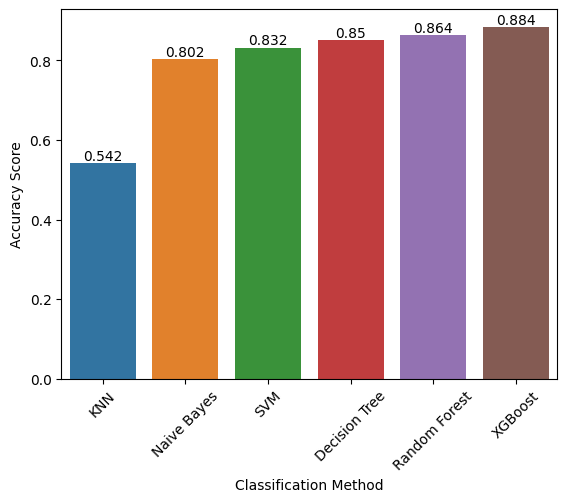

In [ ]:
#Plotting accuracy values from different models for better comparison

import seaborn as sns

ax = sns.barplot(x= accuracy_df.classifier, y= accuracy_df['accuracy score'])
plt.xlabel("Classification Method")
plt.ylabel("Accuracy Score")
plt.xticks(rotation=45)

#print the percentage values
for i in ax.containers:
    ax.bar_label(i)
plt.show()

### **1. Which ML model did you choose from the above created models as your final prediction model and why?**

Instead of selecting a specific model at the outset, an effective approach for this research project could be to begin with a Tree-based model. This choice allows for a more in-depth exploration and understanding of the relationships between the features of a mobile phone and its price range. Using a Tree-based model provides a solid foundation for further investigation and analysis in the research project.

According to the depicted graph, it is evident that Decision Tree-based models consistently yield favorable results. Specifically, a singular Decision Tree model achieved an accuracy of 85%. The utilization of ensemble methods, such as Random Forest Decision Tree models, and XGBoost Decision Tree models, resulted in further improvements, reaching accuracies of 86.4% and 88.4%, respectively.


###**Conclusion and Future Work:**

In summary, our classification analysis provides a comprehensive understanding of Mobile Price Range Prediction. We have outlined crucial findings, delved into the strengths and limitations of the algorithms employed, and suggested potential avenues for future improvement. This undertaking not only sheds light on the intricacies of the classification domain but also lays the groundwork for ongoing exploration and enhancement of predictive models.

###**Key Findings:**

1. **Uniform Distribution of Price Ranges:** The Exploratory Data Analysis (EDA) reveals a balanced distribution of mobile phones across the four price ranges, indicating a diverse dataset for analysis.

2. **Bluetooth Adoption:** Approximately half of the devices feature Bluetooth, while the other half do not, suggesting a relatively even distribution of this feature among different price ranges.

3. **Battery Capacity Correlation:** A discernible pattern emerges, showing a gradual increase in battery capacity as the price range of mobile phones increases, implying a correlation between price and battery power.

4. **RAM Gradation with Price:** RAM exhibits a consistent upward trend with the price range, indicating that higher-cost mobile phones tend to have larger RAM capacities.

5. **Weight and Cost Relationship:** Contrary to expectation, costly phones are found to be lighter, presenting an interesting inverse relationship between weight and price.

6. **Significant Role of Features:** RAM, battery power, and pixel specifications emerge as pivotal factors influencing the price range of mobile phones, highlighting their significance in the decision-making process.

7. **Optimal Model Performance:** Through various experiments, it is concluded that XGBoosting with careful tuning of hyperparameters, yield the best results for predicting mobile phone price ranges. This suggests the efficacy of these models in capturing the complexities of the dataset and making accurate predictions.







---

<center><font size="+4"> ************</font></center>

---